# ***Praktikum 1***

* Lakukan import library dan dan dataset

In [1]:
import pandas as pd
df = pd.read_csv('../data/Iris.csv')
df.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa


* Lakukan pengecekan struktur formatif dari data

In [2]:
df.info()
df.describe()
df['Species'].value_counts

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             150 non-null    int64  
 1   SepalLengthCm  150 non-null    float64
 2   SepalWidthCm   150 non-null    float64
 3   PetalLengthCm  150 non-null    float64
 4   PetalWidthCm   150 non-null    float64
 5   Species        150 non-null    object 
dtypes: float64(4), int64(1), object(1)
memory usage: 7.2+ KB


<bound method IndexOpsMixin.value_counts of 0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iris-virginica
Name: Species, Length: 150, dtype: object>

* Lakukan visualisasi data

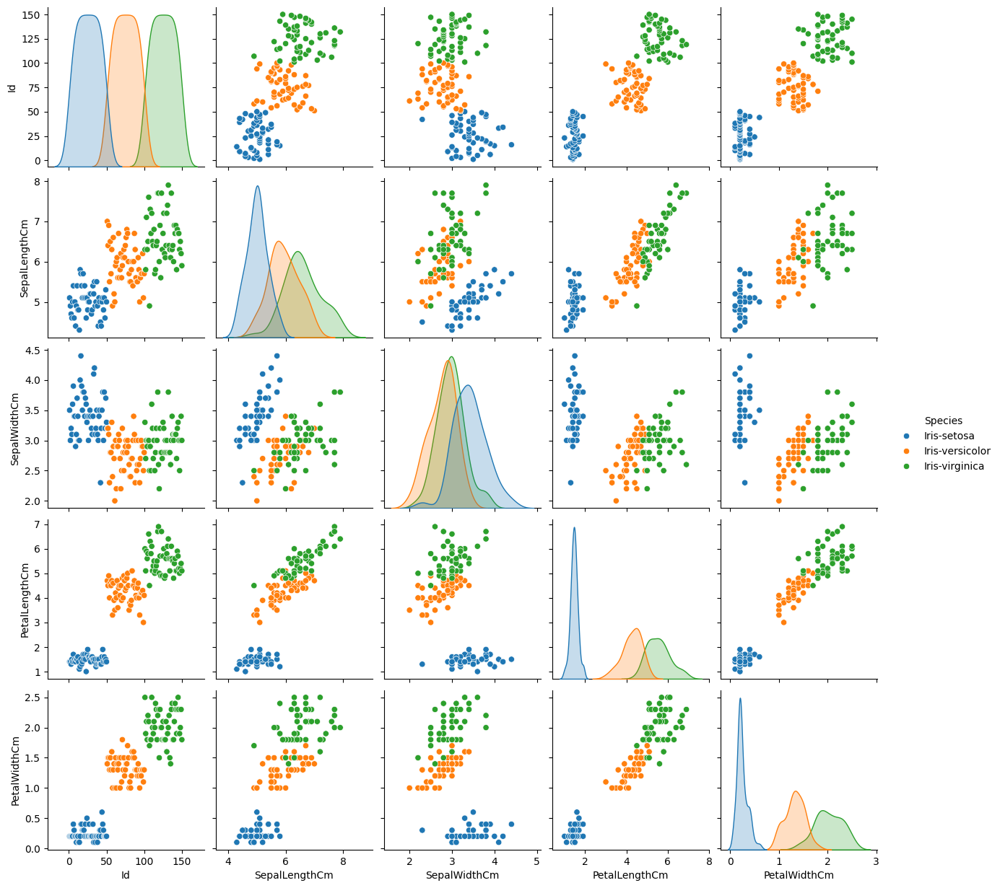

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df, hue='Species')
plt.show()

* Lakukan Preprocessing data 

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 42)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

* Lakukan pembuatan model KNN

In [5]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors= 3)
knn.fit(X_train, y_train)

,n_neighbors,3
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


* Lakukan Evaluasi model KNN

In [6]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
y_pred = knn.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))

Akurasi: 1.0
Confusion Matrix:
 [[19  0  0]
 [ 0 13  0]
 [ 0  0 13]]
Laporan Klasifikasi:
                  precision    recall  f1-score   support

    Iris-setosa       1.00      1.00      1.00        19
Iris-versicolor       1.00      1.00      1.00        13
 Iris-virginica       1.00      1.00      1.00        13

       accuracy                           1.00        45
      macro avg       1.00      1.00      1.00        45
   weighted avg       1.00      1.00      1.00        45



* Lakukan visualisasi model

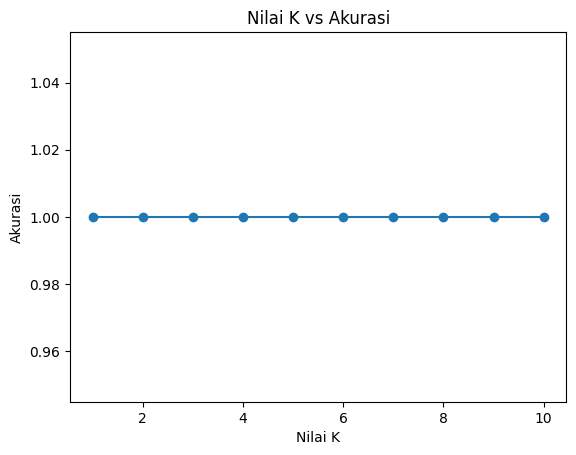

In [7]:
acc = []
for k in range (1, 11):
    model = KNeighborsClassifier(n_neighbors= k)
    model.fit(X_train, y_train)
    acc.append(model.score(X_test, y_test))

plt.plot(range(1, 11), acc, marker='o')
plt.title('Nilai K vs Akurasi')
plt.xlabel('Nilai K')
plt.ylabel('Akurasi')
plt.show()

# ***Praktikum 2***

* Buat dataset dummy

In [8]:
from sklearn.datasets import make_classification
import numpy as np

X,y = make_classification(n_samples=30, n_features=2, n_classes=2, n_informative=2, n_redundant=0, n_repeated=0, shuffle=False)
X = np.absolute(X)
X = np.round(X, 2) * 100
X = X.astype(int)
print(X)
print(y)

[[112  82]
 [ 93  99]
 [ 37 145]
 [233  19]
 [ 82 110]
 [ 91 118]
 [ 56 137]
 [107  78]
 [ 88 184]
 [ 16  19]
 [ 77  63]
 [ 82  54]
 [ 54  99]
 [153 331]
 [ 81  95]
 [ 19 182]
 [109 159]
 [ 22  65]
 [ 81  79]
 [136 150]
 [ 65  66]
 [124 117]
 [118 135]
 [ 90  93]
 [ 64  96]
 [ 70   0]
 [137  83]
 [125  14]
 [ 59  67]
 [ 94 156]]
[0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 1 1]


* Buat dataFrame

In [9]:
y_new = y.reshape(len(y), 1)
data = np.concatenate((X, y_new), axis= 1)
nama_kolom = ['Fitur 1', 'Fitur 2', 'Label']
df = pd.DataFrame(data, columns=nama_kolom)
df.head()

,Fitur 1,Fitur 2,Label
0,112,82,0
1,93,99,0
2,37,145,0
3,233,19,0
4,82,110,0


* Lakukan labeling

In [10]:
labels = {
    1 : 'Kelas A',
    0 : 'Kelas B'
}

df_label = df.copy()
df_label['Label'] = df_label['Label'].map(labels)
df_label.head()

,Fitur 1,Fitur 2,Label
0,112,82,Kelas B
1,93,99,Kelas B
2,37,145,Kelas B
3,233,19,Kelas B
4,82,110,Kelas B


* Lakukan Visualisasi

C:\Users\FANDY HANZ\AppData\Local\Temp\ipykernel_11820\2254056588.py:8: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  class_a = gb.get_group('Kelas A')
C:\Users\FANDY HANZ\AppData\Local\Temp\ipykernel_11820\2254056588.py:9: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  class_b = gb.get_group('Kelas B')


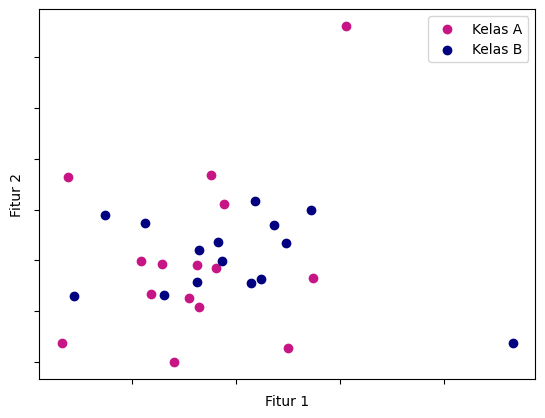

In [11]:
colors = {
    'class_a' : 'MediumVioletRed',
    'class_b' : 'Navy'
    
}

gb = df_label.groupby(['Label'])
class_a = gb.get_group('Kelas A')
class_b = gb.get_group('Kelas B')
plt.scatter(x=class_a['Fitur 1'], y=class_a['Fitur 2'], c=colors['class_a'])
plt.scatter(x=class_b['Fitur 1'], y=class_b['Fitur 2'], c=colors['class_b'])
plt.xlabel('Fitur 1')
plt.ylabel('Fitur 2')
plt.legend(['Kelas A', 'Kelas B'])
plt.gca().axes.xaxis.set_ticklabels([])
plt.gca().axes.yaxis.set_ticklabels([])
plt.show()


* Buat Model Multinomial naive bayes

In [12]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

mnb = MultinomialNB()
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size= 0.3, random_state= 30)
mnb.fit(X_train, y_train)
y_train_pred = mnb.predict(X_train)
acc_train = accuracy_score(y_train, y_train_pred)
y_test_pred = mnb.predict(X_test)
acc_test = accuracy_score(y_test, y_test_pred)
print(f'Hasil akurasi data train: {acc_train}')
print(f'Hasil akurasi data test: {acc_test}')


Hasil akurasi data train: 0.3333333333333333
Hasil akurasi data test: 0.47619047619047616


* Buat Model Gaussian Naive Bayes

In [13]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_train_pred = gnb.predict(X_train)
acc_train = accuracy_score(y_train, y_train_pred)
y_test_pred = gnb.predict(X_test)
acc_test = accuracy_score(y_test, y_test_pred)
print(f'Hasil akurasi data train: {acc_train}')
print(f'Hasil akurasi data test: {acc_test}')

Hasil akurasi data train: 0.7777777777777778
Hasil akurasi data test: 0.6666666666666666


# ***Praktikum 3***

* Lakukan import dataset

In [14]:
data = pd.read_csv('../data/spam.csv', encoding= 'latin1')
data.head()

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN


* Lakukan drop kolom yang tidak berguna

In [15]:
data.drop(columns=['Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4'], axis= 1, inplace= True)
data.columns = ['labels', 'message']
data.head()

,labels,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


* Lakukan inspeksi data

In [16]:
print(data['labels'].value_counts())
print(data.info())
print(data.describe())


labels
ham     4825
spam     747
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   labels   5572 non-null   object
 1   message  5572 non-null   object
dtypes: object(2)
memory usage: 87.2+ KB
None
       labels                 message
count    5572                    5572
unique      2                    5169
top       ham  Sorry, I'll call later
freq     4825                      30


* Lakukan encode

In [17]:
v1 = {
    'ham' : 0,
    'spam' : 1
}

data['labels'] = data['labels'].map(v1)
data.head()

,labels,message
0,0,"Go until jurong point, crazy.. Available only ..."
1,0,Ok lar... Joking wif u oni...
2,1,Free entry in 2 a wkly comp to win FA Cup fina...
3,0,U dun say so early hor... U c already then say...
4,0,"Nah I don't think he goes to usf, he lives aro..."


* Lakukan pemisahan fitur dengan label

In [18]:
X = data['message'].values
X = X.astype(str)
y = data['labels'].values

* Lakukan ekstrasi fitur

In [19]:
from sklearn.feature_extraction.text import CountVectorizer
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 50)
bow = CountVectorizer()
X_train = bow.fit_transform(X_train)
X_test  = bow.transform(X_test)

* Cek fitur dari countVectorizer

In [20]:
print(len(bow.get_feature_names_out()))
print(f'Dimensi data: {X_train.shape}')

7727
Dimensi data: (4457, 7727)


* Lakukan evaluasi Model menggunakan MultinomialNB

In [21]:
mnb = MultinomialNB()
mnb.fit(X_train, y_train)
y_train_pred = mnb.predict(X_train)
acc_train = accuracy_score(y_train, y_train_pred)
y_test_pred = mnb.predict(X_test)
acc_test = accuracy_score(y_test, y_test_pred)
print(f'Hasil akurasi data train: {acc_train}')
print(f'Hasil akurasi data test: {acc_test}')

Hasil akurasi data train: 0.9946152120260264
Hasil akurasi data test: 0.9775784753363229


# ***Tugas Praktikum 1***

* Lakukan import library yang dibutuhkan

In [22]:
import pandas as pd
df = pd.read_csv('../data/voice.csv')
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


* Lakukan cek dataset untuk kekosongan dan sesuai dengan kebutuhan

In [23]:
df.info()
df.describe()
df.isnull().sum

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   obje

<bound method DataFrame.sum of       meanfreq     sd  median    Q25    Q75    IQR   skew   kurt  sp.ent  \
0        False  False   False  False  False  False  False  False   False   
1        False  False   False  False  False  False  False  False   False   
2        False  False   False  False  False  False  False  False   False   
3        False  False   False  False  False  False  False  False   False   
4        False  False   False  False  False  False  False  False   False   
...        ...    ...     ...    ...    ...    ...    ...    ...     ...   
3163     False  False   False  False  False  False  False  False   False   
3164     False  False   False  False  False  False  False  False   False   
3165     False  False   False  False  False  False  False  False   False   
3166     False  False   False  False  False  False  False  False   False   
3167     False  False   False  False  False  False  False  False   False   

        sfm  ...  centroid  meanfun  minfun  maxfun  mea

* lakukan penegecekan untuk values dari nilai object yang ada

In [24]:
df['label'].value_counts

<bound method IndexOpsMixin.value_counts of 0         male
1         male
2         male
3         male
4         male
         ...  
3163    female
3164    female
3165    female
3166    female
3167    female
Name: label, Length: 3168, dtype: object>

* Lakukan visualisasi model

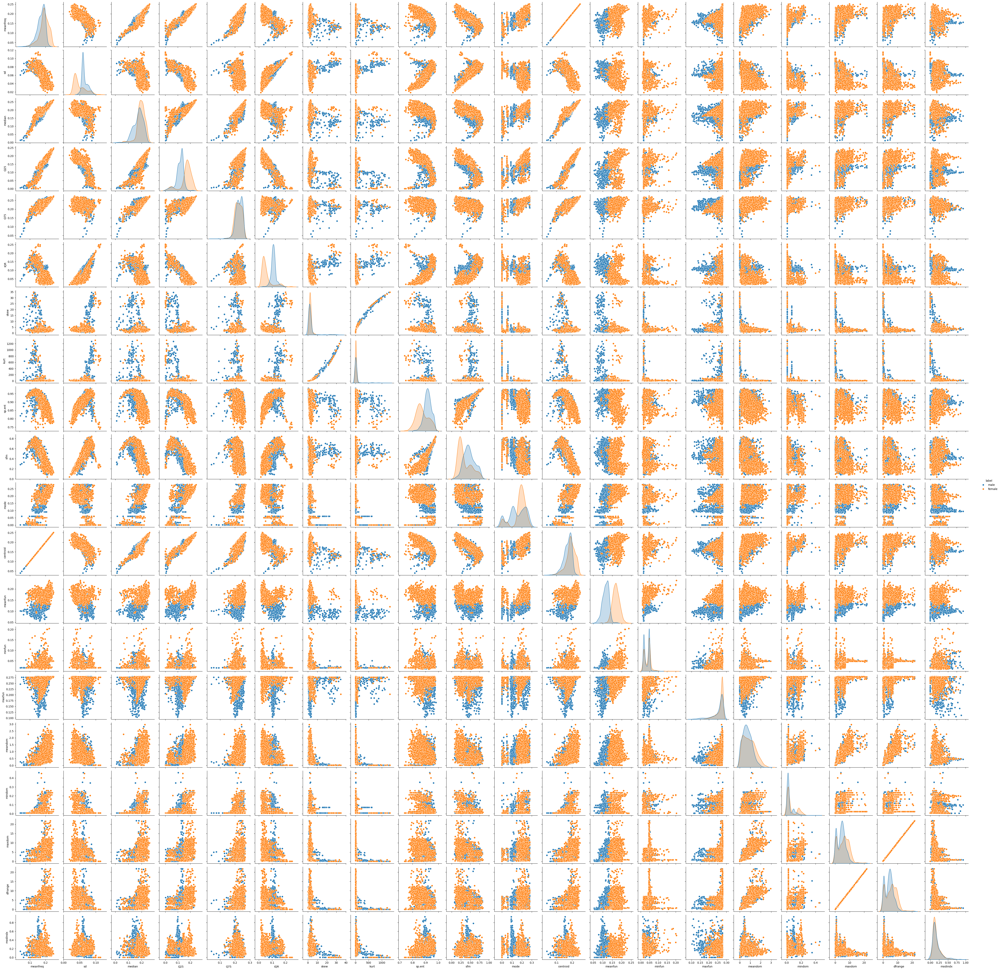

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df, hue='label')
plt.show()

* Lakukan pemisahan fitur

In [26]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

X = df.drop('label', axis= 1)
y = df['label']
feature_names = X.columns
le = LabelEncoder()
y_encoded = le.fit_transform(y)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, 
    test_size=0.2, 
    random_state=42, 
    stratify=y_encoded
)

* menggunakan RFCV untuk menentukan fitur 

Memulai Pemilihan Fitur (RFECV)...

Jumlah fitur optimal: 6
Daftar fitur optimal: ['sd', 'Q25', 'IQR', 'sp.ent', 'sfm', 'meanfun']
Grafik pemilihan fitur disimpan sebagai 'rfecv_plot.png'
Bentuk data latih baru: (2534, 6)


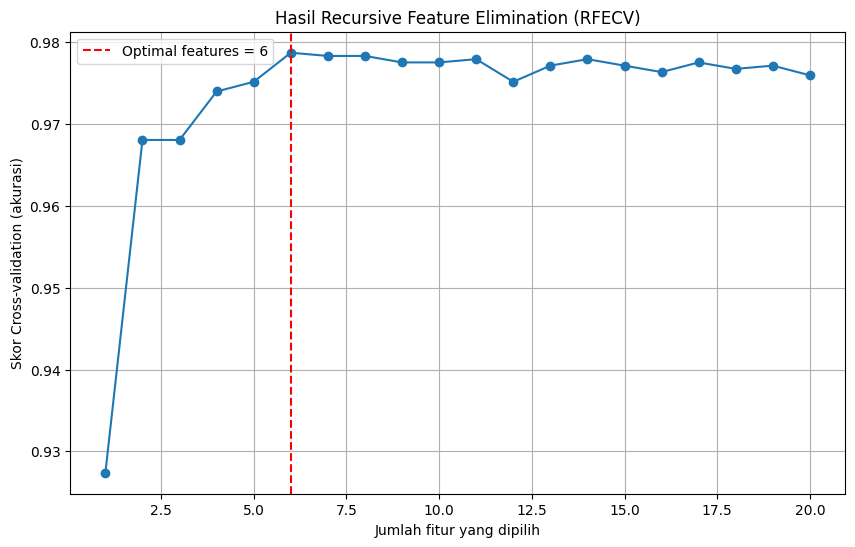

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

# --- Asumsi X_train, y_train, dan feature_names sudah ada ---
# --- dari langkah Pra-pemrosesan Data ---

print("Memulai Pemilihan Fitur (RFECV)...")

# 1. Inisialisasi estimator untuk RFECV
# Kita gunakan RandomForest karena baik dalam menentukan pentingnya fitur
estimator = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)

# 2. Inisialisasi RFECV
# cv=5 berarti 5-fold cross-validation
# scoring='accuracy' adalah metrik yang kita optimalkan
selector = RFECV(estimator, 
                 step=1, 
                 cv=5, 
                 scoring='accuracy', 
                 n_jobs=-1,
                 min_features_to_select=1)

# 3. Melatih selector pada data latih
selector.fit(X_train, y_train)

# 4. Mendapatkan fitur-fitur optimal
optimal_features_mask = selector.support_  # Ini adalah array boolean [True, False, ...]
optimal_features = feature_names[optimal_features_mask]

print(f"\nJumlah fitur optimal: {selector.n_features_}")
print(f"Daftar fitur optimal: {list(optimal_features)}")

# 5. Membuat plot hasil RFECV
plt.figure(figsize=(10, 6))
feature_range = range(1, len(selector.cv_results_['mean_test_score']) + 1)
plt.plot(feature_range, selector.cv_results_['mean_test_score'], marker='o')
plt.axvline(selector.n_features_, color='red', linestyle='--', 
            label=f'Optimal features = {selector.n_features_}')
plt.xlabel("Jumlah fitur yang dipilih")
plt.ylabel("Skor Cross-validation (akurasi)")
plt.title("Hasil Recursive Feature Elimination (RFECV)")
plt.legend()
plt.grid()
print("Grafik pemilihan fitur disimpan sebagai 'rfecv_plot.png'")

# 6. Transformasi data latih dan uji agar hanya menggunakan fitur optimal
X_train_optimal = selector.transform(X_train)
X_test_optimal = selector.transform(X_test)

print(f"Bentuk data latih baru: {X_train_optimal.shape}")

* melakukan pencarian menggunakan gridsearchcv


Memulai pencarian $k$ terbaik (GridSearchCV)...

Nilai $k$ terbaik: 8
Akurasi cross-validation terbaik: 0.9799
Grafik analisis $k$ disimpan sebagai 'knn_k_analysis.png'
Akurasi final model pada data uji: 0.9811


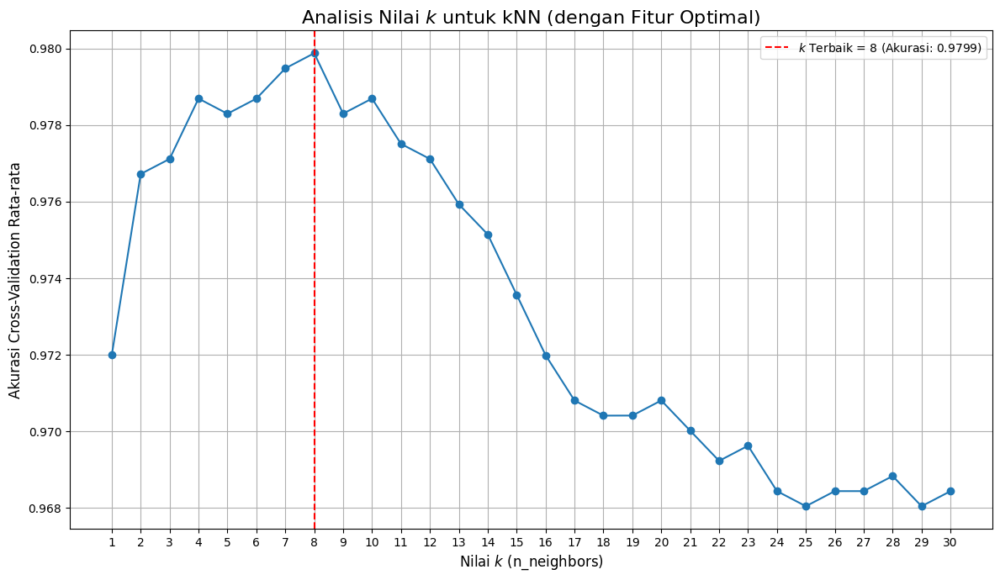

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# --- Asumsi X_train_optimal, y_train, X_test_optimal, y_test ---
# --- sudah ada dari langkah sebelumnya ---

print("\nMemulai pencarian $k$ terbaik (GridSearchCV)...")

# 1. Inisialisasi model kNN
knn = KNeighborsClassifier()

# 2. Mendefinisikan rentang $k$ yang akan diuji
# np.arange(1, 31) akan membuat array [1, 2, 3, ..., 30]
param_grid = {'n_neighbors': np.arange(1, 31)}

# 3. Inisialisasi GridSearchCV
# cv=10 berarti 10-fold cross-validation
grid_search = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', n_jobs=-1)

# 4. Melatih GridSearchCV pada data latih optimal
grid_search.fit(X_train_optimal, y_train)

# 5. Mendapatkan $k$ dan skor terbaik
best_k = grid_search.best_params_['n_neighbors']
best_score = grid_search.best_score_

print(f"\nNilai $k$ terbaik: {best_k}")
print(f"Akurasi cross-validation terbaik: {best_score:.4f}")

# 6. Membuat plot analisis nilai $k$
results = grid_search.cv_results_
plt.figure(figsize=(12, 7))
plt.plot(results['param_n_neighbors'].data, results['mean_test_score'], 
         marker='o', linestyle='-')
plt.axvline(best_k, color='red', linestyle='--', 
            label=f'$k$ Terbaik = {best_k} (Akurasi: {best_score:.4f})')
plt.title("Analisis Nilai $k$ untuk kNN (dengan Fitur Optimal)", fontsize=16)
plt.xlabel("Nilai $k$ (n_neighbors)", fontsize=12)
plt.ylabel("Akurasi Cross-Validation Rata-rata", fontsize=12)
plt.legend()
plt.grid(True)
plt.xticks(np.arange(1, 31, 1)) # Tampilkan semua angka $k$ di sumbu x
plt.tight_layout()
print("Grafik analisis $k$ disimpan sebagai 'knn_k_analysis.png'")

# 7. (Opsional) Evaluasi model final pada data uji
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test_optimal)
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Akurasi final model pada data uji: {test_accuracy:.4f}")

# ***Tugas Praktikum 2***

* Melakukan Load dataset

In [32]:
df = pd.read_csv('../data/spam.csv', encoding= 'latin1')
df.head()

,v1,v2,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,ham,"Go until jurong point, crazy.. Available only ...",NaN,NaN,NaN
1,ham,Ok lar... Joking wif u oni...,NaN,NaN,NaN
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,NaN,NaN,NaN
3,ham,U dun say so early hor... U c already then say...,NaN,NaN,NaN
4,ham,"Nah I don't think he goes to usf, he lives aro...",NaN,NaN,NaN


* Melakukan pembersihan data 

In [33]:
df.drop(columns=['Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4'], axis= 1, inplace= True)
df.columns = ['labels', 'message']
df.head()

,labels,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


* Lakukan encode pada dataset labels

In [35]:
le = LabelEncoder()
df['labels_en'] = le.fit_transform(df['labels'])
df.head()

,labels,message,labels_en
0,ham,"Go until jurong point, crazy.. Available only ...",0
1,ham,Ok lar... Joking wif u oni...,0
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,1
3,ham,U dun say so early hor... U c already then say...,0
4,ham,"Nah I don't think he goes to usf, he lives aro...",0


* Melakukan pencarian fitur

In [36]:
spam_label_numeric = le.transform(['spam'])[0]
target_names_labels = le.classes_
print(f"\nLabel 'spam' di-encode menjadi: {spam_label_numeric}")


Label 'spam' di-encode menjadi: 1


* Membuat model

In [37]:
X = df['message']
y = df['labels_en']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 42, stratify= y)

* Model naive bayes dengan count vectorizer

In [38]:
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

print("\n--- Model 1: Multinomial Naive Bayes dengan CountVectorizer ---")

# --- 1. Buat Pipeline (Vectorizer + Classifier) ---
pipeline_countvec = Pipeline([
    ('vectorizer', CountVectorizer(stop_words='english')),
    ('classifier', MultinomialNB())
])

# --- 2. Latih Model ---
pipeline_countvec.fit(X_train, y_train)

# --- 3. Prediksi Data Test ---
y_pred_countvec = pipeline_countvec.predict(X_test)

# --- 4. Evaluasi Hasil ---
accuracy_countvec = accuracy_score(y_test, y_pred_countvec)
precision_countvec = precision_score(y_test, y_pred_countvec, pos_label=spam_label_numeric)
recall_countvec = recall_score(y_test, y_pred_countvec, pos_label=spam_label_numeric)
f1_countvec = f1_score(y_test, y_pred_countvec, pos_label=spam_label_numeric)

print(f"Accuracy: {accuracy_countvec:.4f}")
print(f"Precision (Spam): {precision_countvec:.4f}")
print(f"Recall (Spam): {recall_countvec:.4f}")
print(f"F1-score (Spam): {f1_countvec:.4f}")

print("\nConfusion Matrix (CountVectorizer):")
print(confusion_matrix(y_test, y_pred_countvec))

print("\nClassification Report (CountVectorizer):")
print(classification_report(y_test, y_pred_countvec, target_names=target_names_labels))


--- Model 1: Multinomial Naive Bayes dengan CountVectorizer ---
Accuracy: 0.9864
Precision (Spam): 0.9615
Recall (Spam): 0.9358
F1-score (Spam): 0.9485

Confusion Matrix (CountVectorizer):
[[1199    7]
 [  12  175]]

Classification Report (CountVectorizer):
              precision    recall  f1-score   support

         ham       0.99      0.99      0.99      1206
        spam       0.96      0.94      0.95       187

    accuracy                           0.99      1393
   macro avg       0.98      0.97      0.97      1393
weighted avg       0.99      0.99      0.99      1393



* Melakukan perbandingan naive bayes dengan TF-IDF

In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer
print("\n--- Model 2: Multinomial Naive Bayes dengan TF-IDF Vectorizer ---")

# --- 1. Buat Pipeline (Vectorizer + Classifier) ---
pipeline_tfidf = Pipeline([
    ('vectorizer', TfidfVectorizer(stop_words='english')),
    ('classifier', MultinomialNB())
])

# --- 2. Latih Model ---
pipeline_tfidf.fit(X_train, y_train)

# --- 3. Prediksi Data Test ---
y_pred_tfidf = pipeline_tfidf.predict(X_test)

# --- 4. Evaluasi Hasil ---
accuracy_tfidf = accuracy_score(y_test, y_pred_tfidf)
precision_tfidf = precision_score(y_test, y_pred_tfidf, pos_label=spam_label_numeric)
recall_tfidf = recall_score(y_test, y_pred_tfidf, pos_label=spam_label_numeric)
f1_tfidf = f1_score(y_test, y_pred_tfidf, pos_label=spam_label_numeric)

print(f"Accuracy: {accuracy_tfidf:.4f}")
print(f"Precision (Spam): {precision_tfidf:.4f}")
print(f"Recall (Spam): {recall_tfidf:.4f}")
print(f"F1-score (Spam): {f1_tfidf:.4f}")

print("\nConfusion Matrix (TF-IDF):")
print(confusion_matrix(y_test, y_pred_tfidf))

print("\nClassification Report (TF-IDF):")
print(classification_report(y_test, y_pred_tfidf, target_names=target_names_labels))

# --- 5. Perbandingan dengan Model 1 ---
print("\n--- Perbandingan Model ---")

comparison_data = {
    'Metrik': ['Accuracy', 'Precision (Spam)', 'Recall (Spam)', 'F1-score (Spam)'],
    'CountVectorizer (Soal 1)': [accuracy_countvec, precision_countvec, recall_countvec, f1_countvec],
    'TF-IDF (Soal 2)': [accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf]
}

df_comparison = pd.DataFrame(comparison_data)
# Menggunakan .to_markdown agar lebih rapi di output
print(df_comparison.to_markdown(index=False, floatfmt=".4f"))


--- Model 2: Multinomial Naive Bayes dengan TF-IDF Vectorizer ---
Accuracy: 0.9691
Precision (Spam): 1.0000
Recall (Spam): 0.7701
F1-score (Spam): 0.8701

Confusion Matrix (TF-IDF):
[[1206    0]
 [  43  144]]

Classification Report (TF-IDF):
              precision    recall  f1-score   support

         ham       0.97      1.00      0.98      1206
        spam       1.00      0.77      0.87       187

    accuracy                           0.97      1393
   macro avg       0.98      0.89      0.93      1393
weighted avg       0.97      0.97      0.97      1393


--- Perbandingan Model ---
| Metrik           |   CountVectorizer (Soal 1) |   TF-IDF (Soal 2) |
|:-----------------|---------------------------:|------------------:|
| Accuracy         |                     0.9864 |            0.9691 |
| Precision (Spam) |                     0.9615 |            1.0000 |
| Recall (Spam)    |                     0.9358 |            0.7701 |
| F1-score (Spam)  |                     0.9485 |   

* Hasil Fitur terbaik 

In [41]:
print("\n--- Kesimpulan ---")

# Membandingkan F1-score (Spam) sebagai metrik utama untuk keseimbangan
if f1_countvec > f1_tfidf:
    print("Model dengan CountVectorizer memiliki F1-score (Spam) yang lebih tinggi.")
elif f1_tfidf > f1_countvec:
    print("Model dengan TF-IDF memiliki F1-score (Spam) yang lebih tinggi.")
else:
    print("Kedua model memiliki F1-score (Spam) yang identik.")

# Membandingkan Akurasi
if accuracy_countvec > accuracy_tfidf:
    print("Model dengan CountVectorizer memiliki Akurasi keseluruhan yang lebih tinggi.")
elif accuracy_tfidf > accuracy_countvec:
    print("Model dengan TF-IDF memiliki Akurasi keseluruhan yang lebih tinggi.")
else:
    print("Kedua model memiliki Akurasi keseluruhan yang identik.")

# Kesimpulan akhir berdasarkan F1-score dan Akurasi
if f1_countvec > f1_tfidf and accuracy_countvec >= accuracy_tfidf:
    print("\nKesimpulan Akhir: Fitur CountVectorizer memberikan performa terbaik secara keseluruhan untuk kasus ini.")
elif f1_tfidf > f1_countvec and accuracy_tfidf >= accuracy_countvec:
     print("\nKesimpulan Akhir: Fitur TF-IDF memberikan performa terbaik secara keseluruhan untuk kasus ini.")
elif f1_countvec > f1_tfidf:
     print("\nKesimpulan Akhir: Fitur CountVectorizer lebih baik dalam F1-score (spam), meskipun akurasi mungkin sebanding.")
elif f1_tfidf > f1_countvec:
     print("\nKesimpulan Akhir: Fitur TF-IDF lebih baik dalam F1-score (spam), meskipun akurasi mungkin sebanding.")
else: 
    print("\nKesimpulan Akhir: Kedua fitur (CountVectorizer dan TF-IDF) memberikan performa yang sangat mirip.")


--- Kesimpulan ---
Model dengan CountVectorizer memiliki F1-score (Spam) yang lebih tinggi.
Model dengan CountVectorizer memiliki Akurasi keseluruhan yang lebih tinggi.

Kesimpulan Akhir: Fitur CountVectorizer memberikan performa terbaik secara keseluruhan untuk kasus ini.
